In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
%matplotlib inline

In [2]:
mobile = pd.read_csv('BananaMobileDataset.csv', names= ['id','name', 'battery_power', 'bluetooth', 'clock_speed', 'front_camera',
       'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores',
       'primary_camera', 'px_height', 'px_width', 'ram', 'screen_height',
       'screen_width ', 'touch_screen', 'wifi', 'warranty ', 'fingerprint',
       'price'], skiprows = 1)
mobile.drop(mobile.columns[0], axis = 1, inplace = True)
mobile.head()

,name,battery_power,bluetooth,clock_speed,front_camera,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,screen_height,screen_width,touch_screen,wifi,warranty,fingerprint,price
0,SAMSUNG SMARTPHONE GALAXY A31,5000,Bluetooth V 5.0,2.00,20,1,128,0.80,0.185,8,...,2400,1080,8,15.93,7.31,1,1,1,1,6999
1,SAMSUNG SMARTPHONE GALAXY S21 ULTRA (16+512) P...,5000,Bluetooth V 5.1,2.90,40,1,512,0.80,0.227,8,...,3200,1440,16,16.51,7.56,1,1,1,1,45900
2,SAMSUNG SMARTPHONE GALAXY A01 (2+16) BLACK,3000,Bluetooth V 4.2,1.95,5,1,16,0.80,0.149,8,...,1520,720,2,14.62,7.00,1,1,1,1,3290
3,SAMSUNG SMARTPHONE GALAXY A02S (4+64GB) BLACK,5000,Bluetooth V 4.2,1.80,5,1,64,0.91,0.196,8,...,1600,720,4,16.42,7.59,1,1,1,0,3999
4,SAMSUNG SMARTPHONE GALAXY A12 (4+128GB) BLACK,5000,Bluetooth V 5.0,2.30,8,1,128,0.80,0.205,8,...,1560,720,4,16.40,7.58,1,1,1,1,4999


# **Exploratory Data Analysis**

    Explore for the significant features in order to understand the attributes of data and select the right models

In [3]:
mobile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 163 entries, 0 to 162
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            163 non-null    object 
 1   battery_power   163 non-null    int64  
 2   bluetooth       163 non-null    object 
 3   clock_speed     163 non-null    float64
 4   front_camera    163 non-null    int64  
 5   four_g          163 non-null    int64  
 6   int_memory      163 non-null    int64  
 7   m_dep           163 non-null    float64
 8   mobile_wt       163 non-null    float64
 9   n_cores         163 non-null    int64  
 10  primary_camera  163 non-null    int64  
 11  px_height       163 non-null    int64  
 12  px_width        163 non-null    int64  
 13  ram             163 non-null    int64  
 14  screen_height   163 non-null    float64
 15  screen_width    163 non-null    float64
 16  touch_screen    163 non-null    int64  
 17  wifi            163 non-null    int

In [4]:
corrset = mobile.iloc[:, [1,3,4,6,7,8,9,10,11,12,13,14,15,20]]
# mobile.describe()
# type(corrset.iloc[:, [2]])
mobile.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,163.0,4436.754601,690.244161,1821.000,4000.00,4315.00,5000.000,6000.00
clock_speed,163.0,2.328650,0.405244,1.300,2.00,2.30,2.765,3.13
front_camera,163.0,17.607362,9.982352,5.000,8.00,16.00,24.000,44.00
four_g,163.0,1.000000,0.000000,1.000,1.00,1.00,1.000,1.00
int_memory,163.0,140.760736,96.150656,16.000,64.00,128.00,128.000,512.00
m_dep,163.0,0.821577,0.069335,0.700,0.80,0.80,0.900,0.99
mobile_wt,163.0,0.190184,0.017788,0.148,0.18,0.19,0.198,0.24
n_cores,163.0,7.950920,0.441709,4.000,8.00,8.00,8.000,8.00
primary_camera,163.0,40.871166,26.322817,5.000,13.00,48.00,64.000,108.00
px_height,163.0,2176.282209,480.602702,960.000,1600.00,2340.00,2400.000,3216.00


In [5]:
ranges = ['Low cost', 'Medium cost', 'High cost', 'Very high cost']
price_range = pd.cut(mobile['price'], labels = ranges, bins = 4)

pd.cut(mobile['price'], bins = 4).value_counts()

(1843.99, 13392.5]    102
(13392.5, 24895.0]     28
(24895.0, 36397.5]     23
(36397.5, 47900.0]     10
Name: price, dtype: int64

<AxesSubplot:title={'center':'Number of phone seperate by price range'}, xlabel='price_range', ylabel='count'>

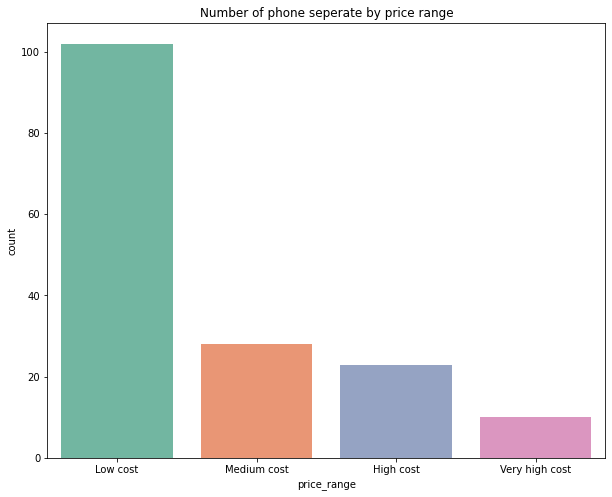

In [6]:
# fig, ax = plt.subplots(16, 4)
# for (num, i) in enumerate(corrset):
# #     print(i)
#     ax.histplot(corrset.iloc[:, [num]])
# # sns.displot(corrset['battery_power'], kind="box")
countrange = mobile.copy()
fig, ax = plt.subplots(figsize=(10,8)) 
mobile['price_range'] = price_range
countrange['price_range'] = price_range
plt.title('Number of phone seperate by price range')
plt.ylabel('Number of phone')
sns.countplot(x= 'price_range', data = countrange, palette="Set2")
# countrange['price_range'].value_counts()
# countrange['price_range'].count()

<AxesSubplot:xlabel='price', ylabel='Count'>

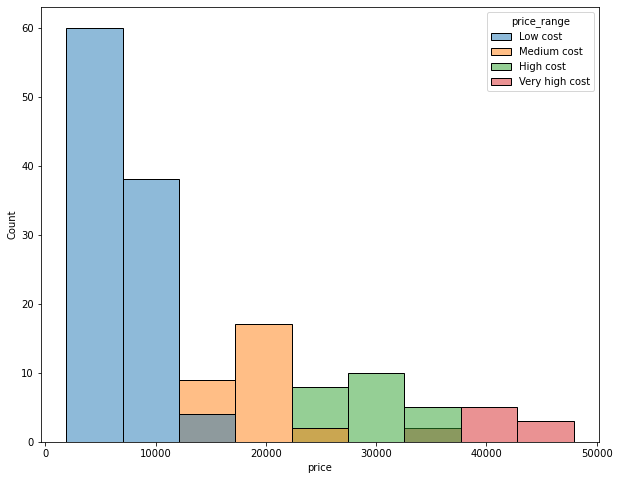

In [7]:
fig, ax = plt.subplots(figsize=(10,8)) 
sns.histplot(x = mobile['price'], hue = mobile['price_range'])

In [8]:
countrange.iloc[:,2] = countrange['bluetooth'].astype('category')
# countrange.info()
# countrange.columns

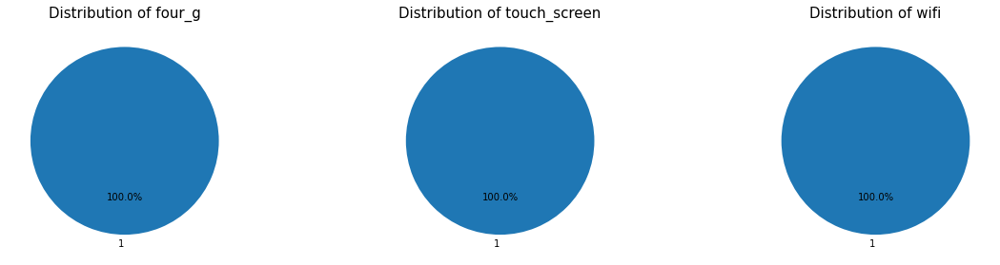

In [9]:
feature = ['four_g', 'touch_screen', 'wifi']

plt.figure(figsize=(20,10))
count = 0

for i in feature:
    myexplode = [0.2, 0]
    
    colors = ['#66b3ff','#ff9999','#ff9999']
    
    labels = mobile[i].value_counts().index
    sizes = mobile[i].value_counts().values  
    
    plt.subplot(2,3,count+1)
    plt.pie(sizes, labels=labels, startangle=90, autopct='%1.1f%%')
    plt.title(f'Distribution of {feature[count]}', color = 'black',fontsize = 15)
    count += 1

<AxesSubplot:xlabel='bluetooth', ylabel='count'>

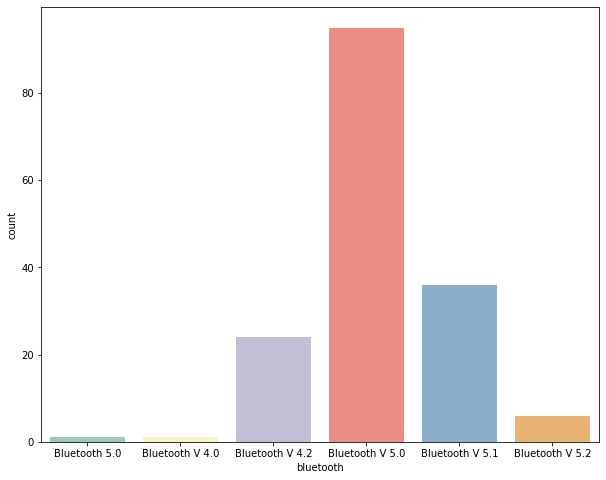

In [10]:
fig, ax = plt.subplots(figsize=(10,8)) 
sns.countplot(x = 'bluetooth', data = countrange, palette="Set3")

<AxesSubplot:xlabel='price_range', ylabel='battery_power'>

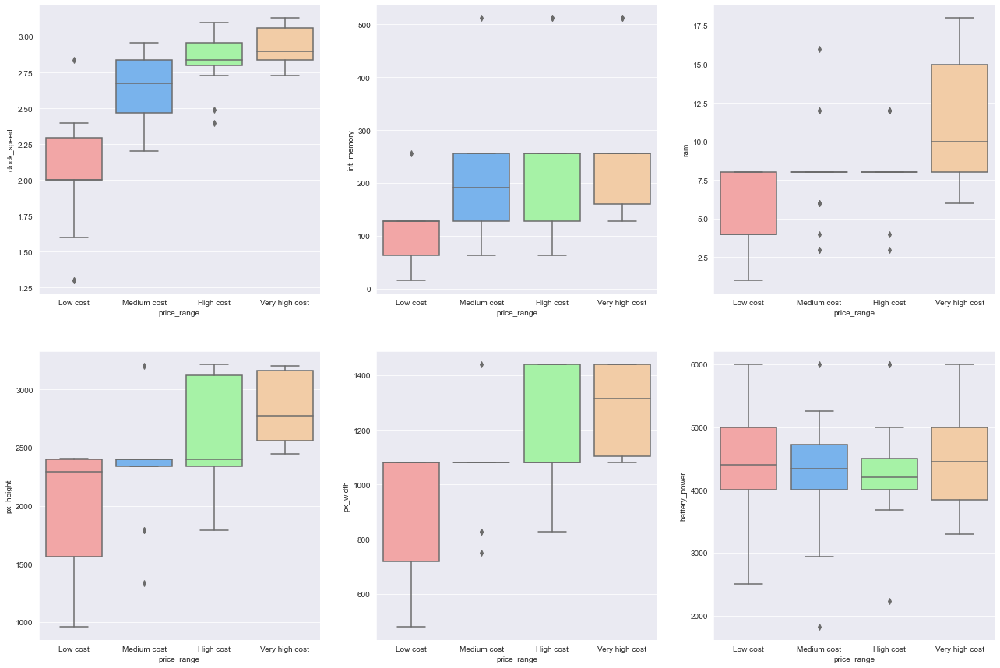

In [11]:
plt.figure(figsize=(22,15))
palette = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#fbdf70','#ac9fd0','#8b7470']
sns.set_style('darkgrid')
plt.subplot(2,3,1)
sns.boxplot(x = 'price_range', y = 'clock_speed', data = mobile, palette=palette)
plt.subplot(2,3,2)
sns.boxplot(x = 'price_range', y = 'int_memory', data = mobile, palette=palette)
plt.subplot(2,3,3)
sns.boxplot(x = 'price_range', y = 'ram', data = mobile, palette=palette)
plt.subplot(2,3,4)
sns.boxplot(x = 'price_range', y = 'px_height', data = mobile, palette=palette)
plt.subplot(2,3,5)
sns.boxplot(x = 'price_range', y = 'px_width', data = mobile, palette=palette)
plt.subplot(2,3,6)
sns.boxplot(x = 'price_range', y = 'battery_power', data = mobile, palette=palette)

In [12]:
mobile.profile_report()

Summarize dataset:   0%|          | 0/35 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

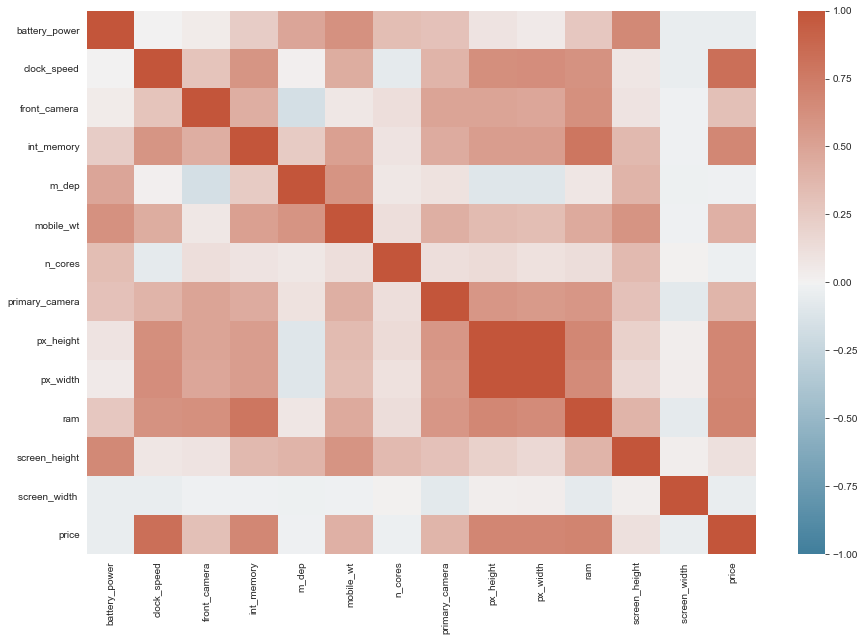

In [20]:
corr = corrset.corr()
fig, ax = plt.subplots(figsize=(15,10)) 
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmax=1,vmin = -1, center=0,
             cbar_kws={"shrink": 1})

C:\Users\pond\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\pond\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\pond\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

Text(0.5, 1.0, 'primary camera Interval')

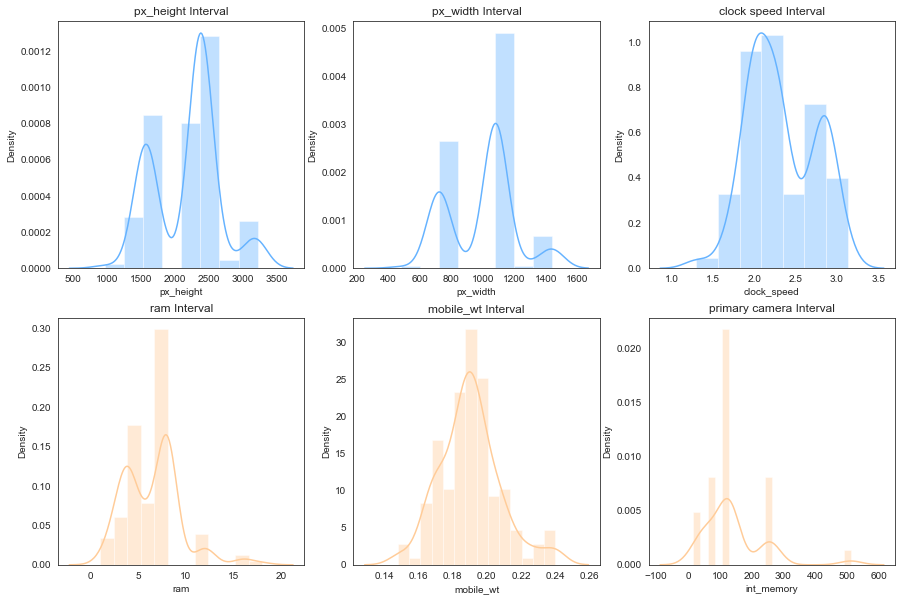

In [21]:
plt.figure(figsize=(15,10))
sns.set_style('white')
plt.subplot(2,3,1)
sns.distplot(mobile['px_height'], color="#66b3ff").set_title('px_height Interval')
plt.subplot(2,3,2)
sns.distplot(mobile['px_width'], color="#66b3ff").set_title('px_width Interval')
plt.subplot(2,3,3)
sns.distplot(mobile['clock_speed'], color="#66b3ff").set_title('clock speed Interval')
plt.subplot(2,3,4)
sns.distplot(mobile['ram'], color="#ffcc99").set_title('ram Interval')
plt.subplot(2,3,5)
sns.distplot(mobile['mobile_wt'], color="#ffcc99").set_title('mobile_wt Interval')
plt.subplot(2,3,6)
sns.distplot(mobile['int_memory'], color="#ffcc99").set_title('primary camera Interval')

### **จาก data type**
 - feature เยอะ
 - correlation กลางๆ ไม่สูง
 - model possibilities
     - linear regression
     - random forest
     - KNN - according to many features 
     - normal decision tree

# **Data Preparation**

Mapping price into price ranges

In [22]:
mobileSet = mobile.iloc[:, [1,3,4,6,7,8,11,12,13,14,15,21]]

**Specify Price Ranges**

In [23]:
X = mobile.drop(['name','bluetooth', 'price','price_range'], axis = 1)

In [24]:
Y = mobile['price_range']

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=101)

# **Modeling**

In [26]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix

### **Random Forest**

In [27]:
mobilewithout = mobile.drop(['name', 'bluetooth'], axis = 1)
mobileWithRange = mobilewithout.copy()
mobileWithRange["price_range"] = price_range
X_range = mobileWithRange.drop(['price', 'price_range'], axis = 1)
Y_range = mobileWithRange['price_range']

In [28]:
Xrange_train, Xrange_test, yrange_train, yrange_test = train_test_split(X_range, Y_range, test_size=0.2, random_state=101)

In [29]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=100, random_state=1)
rfc.fit(Xrange_train, yrange_train)
rfc.score(Xrange_test, yrange_test)

0.8181818181818182

In [30]:
Xrange_train.columns

Index(['battery_power', 'clock_speed', 'front_camera', 'four_g', 'int_memory',
       'm_dep', 'mobile_wt', 'n_cores', 'primary_camera', 'px_height',
       'px_width', 'ram', 'screen_height', 'screen_width ', 'touch_screen',
       'wifi', 'warranty ', 'fingerprint'],
      dtype='object')

In [31]:
rfc.feature_importances_

array([0.06271929, 0.30173717, 0.06086732, 0.        , 0.11969916,
       0.03731689, 0.07213294, 0.00711606, 0.03841591, 0.07240732,
       0.04688721, 0.03550191, 0.06901422, 0.06933214, 0.        ,
       0.        , 0.        , 0.00685246])

In [32]:
featureSelected = mobile[['clock_speed', 'front_camera', 'int_memory', 'm_dep', 'mobile_wt', 'primary_camera', 'px_height', 'px_width', 'price_range']]
newXrange = featureSelected.drop('price_range', axis = 1)
newYrange = featureSelected['price_range']

In [33]:
newXrange_train, newXrange_test, newyrange_train, newyrange_test = train_test_split(newXrange, newYrange, test_size=0.2, random_state=101)
newXrange_train

,clock_speed,front_camera,int_memory,m_dep,mobile_wt,primary_camera,px_height,px_width
144,2.84,24,512,0.99,0.239,64,2448,1080
48,2.20,44,256,0.80,0.175,64,2400,1080
114,2.30,16,128,0.80,0.209,48,2400,1080
41,2.35,5,64,0.80,0.165,13,1560,720
53,1.80,16,64,0.80,0.168,13,1520,720
...,...,...,...,...,...,...,...,...
63,2.80,25,256,0.90,0.186,16,2340,1080
70,2.30,8,64,0.80,0.192,13,1600,720
81,1.95,8,32,0.80,0.190,13,1544,720
11,2.70,32,128,0.80,0.199,12,2400,1080


In [34]:
rfc2 = RandomForestClassifier(n_estimators=100, random_state=2)
rfc2.fit(newXrange_train, yrange_train)

RandomForestClassifier(random_state=2)

In [35]:
rfc2.score(newXrange_test, newyrange_test)

0.8484848484848485

In [36]:
y_predict_rfc2 = rfc2.predict(newXrange_test)
y_predict_rfc2

array(['Medium cost', 'High cost', 'Low cost', 'Low cost', 'Low cost',
       'Low cost', 'Low cost', 'Low cost', 'Low cost', 'Medium cost',
       'High cost', 'Low cost', 'Very high cost', 'Medium cost',
       'High cost', 'Low cost', 'Low cost', 'Low cost', 'Low cost',
       'High cost', 'Low cost', 'Medium cost', 'Very high cost',
       'Low cost', 'High cost', 'Very high cost', 'Medium cost',
       'Medium cost', 'Low cost', 'Low cost', 'Low cost', 'Low cost',
       'High cost'], dtype=object)

In [37]:
estimator = rfc2.estimators_[5]
estimator
# Xrange_train.columns

DecisionTreeClassifier(max_features='auto', random_state=1922988331)

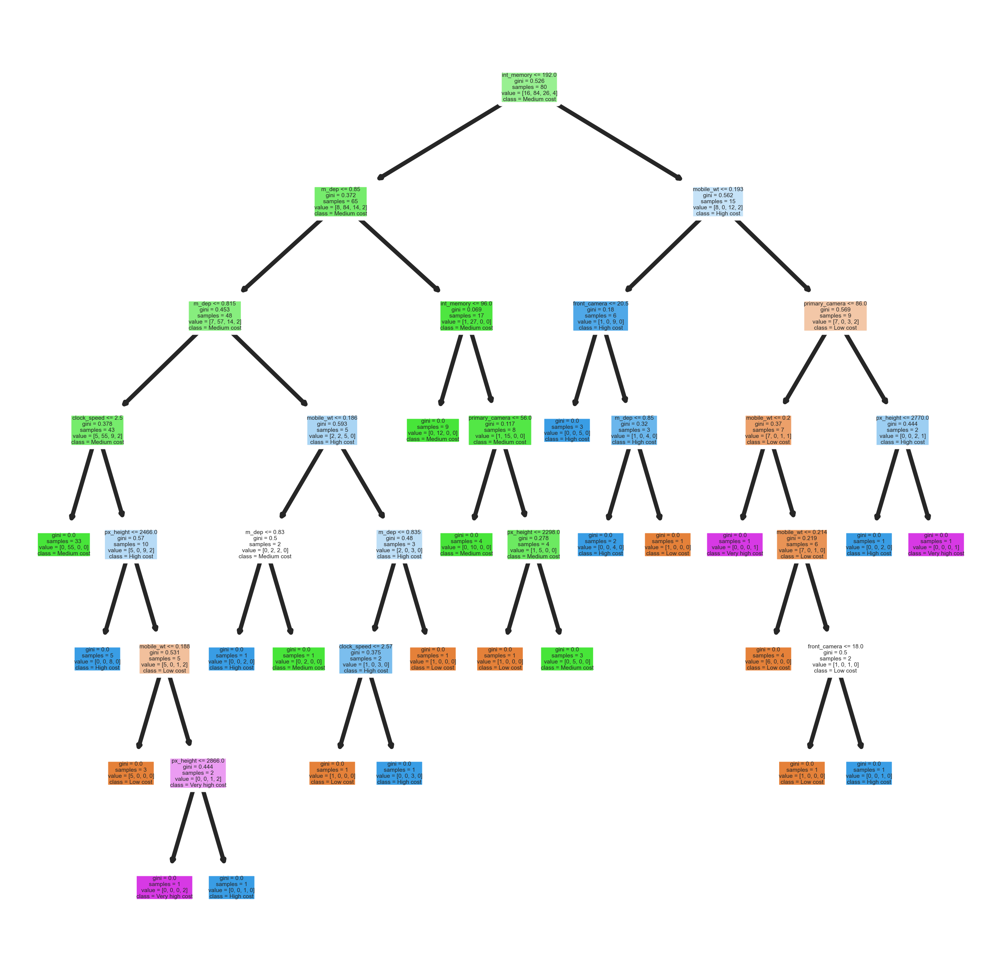

In [38]:
from sklearn.tree import export_graphviz
from sklearn import tree
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
fn=newXrange_train.columns
cn=ranges
tree.plot_tree(rfc2.estimators_[5],
               feature_names = fn, 
               class_names=cn, rounded = True,
               filled = True);
fig.savefig('rf_individualtree.png')

In [39]:
y_predict_rfc = rfc2.predict(newXrange_test)
y_predict_rfc

array(['Medium cost', 'High cost', 'Low cost', 'Low cost', 'Low cost',
       'Low cost', 'Low cost', 'Low cost', 'Low cost', 'Medium cost',
       'High cost', 'Low cost', 'Very high cost', 'Medium cost',
       'High cost', 'Low cost', 'Low cost', 'Low cost', 'Low cost',
       'High cost', 'Low cost', 'Medium cost', 'Very high cost',
       'Low cost', 'High cost', 'Very high cost', 'Medium cost',
       'Medium cost', 'Low cost', 'Low cost', 'Low cost', 'Low cost',
       'High cost'], dtype=object)

In [40]:
train_rf_probs = rfc.predict_proba(Xrange_test)[:, 1]
train_rf_probs

array([0.27, 0.07, 0.99, 0.97, 0.99, 0.96, 0.99, 0.9 , 0.96, 0.09, 0.06,
       0.94, 0.07, 0.13, 0.13, 0.98, 0.74, 0.54, 0.88, 0.01, 0.99, 0.39,
       0.04, 0.98, 0.05, 0.03, 0.01, 0.18, 1.  , 0.85, 1.  , 0.97, 0.08])

## **Logistic Regression**

In [41]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [42]:
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression()
lg.fit(X_train, y_train)
lg.score(X_test, y_test)

0.8484848484848485

In [43]:
ypredict_lg = lg.predict(X_test)
ypredict_lg

array(['Medium cost', 'High cost', 'Low cost', 'Low cost', 'Low cost',
       'Low cost', 'Low cost', 'Low cost', 'Low cost', 'Very high cost',
       'Very high cost', 'Low cost', 'Very high cost', 'Medium cost',
       'High cost', 'Low cost', 'Low cost', 'Medium cost', 'Low cost',
       'High cost', 'Low cost', 'Low cost', 'Very high cost', 'Low cost',
       'High cost', 'Very high cost', 'Medium cost', 'Medium cost',
       'Low cost', 'Low cost', 'Low cost', 'Low cost', 'High cost'],
      dtype=object)

### **Features Tuning**

#### **SelectFromModel**

The intended method for this function is that it will select the features by importance and you can just save them as its own features dataframe and directly implement into a tuned model

In [44]:
from sklearn.feature_selection import SelectFromModel
smf = SelectFromModel(lg, threshold=-np.inf, max_features=10)
smf.fit(X_train, y_train)
feature_idx = smf.get_support()
feature_name = X.columns[feature_idx]
feature_name

Index(['battery_power', 'clock_speed', 'front_camera', 'int_memory', 'm_dep',
       'mobile_wt', 'px_width', 'ram', 'screen_height', 'fingerprint'],
      dtype='object')

In [45]:
X_fea = mobile[feature_name]
y_fea = mobile['price_range']
Xfea_train, Xfea_test, yfea_train, yfea_test = train_test_split(X_fea, y_fea, test_size=0.2, random_state=101)

In [46]:
Xfea_train = sc.fit_transform(Xfea_train)
Xfea_test = sc.transform(Xfea_test)
lg = LogisticRegression(random_state=3)
lg.fit(Xfea_train, yfea_train)
lg.score(Xfea_test, yfea_test)

0.8181818181818182

# **Evaluation**

### **Random Forest Classification Evaluation**

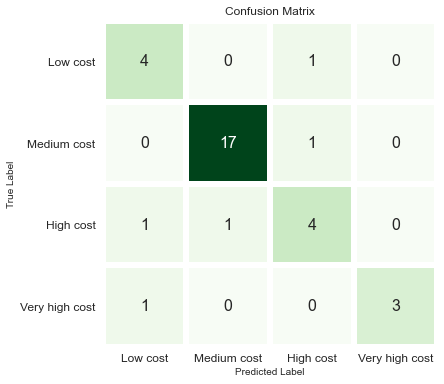

In [47]:
cm = confusion_matrix(yrange_test, y_predict_rfc2)
df1 = pd.DataFrame(columns=ranges, index= ranges, data= cm)
f,ax = plt.subplots(figsize=(6,6))


sns.heatmap(df1, annot=True,cmap="Greens", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,annot_kws={"size": 16})
plt.xlabel("Predicted Label")
plt.xticks(size = 12)
plt.yticks(size = 12, rotation = 0)
plt.ylabel("True Label")
plt.title("Confusion Matrix", size = 12)
plt.show()

In [48]:
print(classification_report(yrange_test, y_predict_rfc))

                precision    recall  f1-score   support

     High cost       0.67      0.80      0.73         5
      Low cost       0.94      0.94      0.94        18
   Medium cost       0.67      0.67      0.67         6
Very high cost       1.00      0.75      0.86         4

      accuracy                           0.85        33
     macro avg       0.82      0.79      0.80        33
  weighted avg       0.86      0.85      0.85        33



### **Logistic Regression Evaluation**

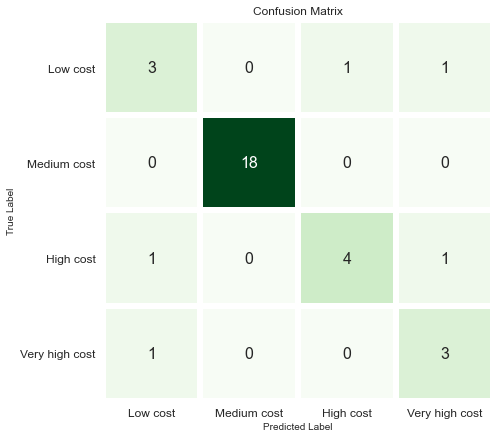

In [49]:
cm = confusion_matrix(y_test, ypredict_lg)
df1 = pd.DataFrame(columns=ranges, index= ranges, data= cm)
f,ax = plt.subplots(figsize=(7,7))


sns.heatmap(df1, annot=True,cmap="Greens", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,annot_kws={"size": 16})
plt.xlabel("Predicted Label")
plt.xticks(size = 12)
plt.yticks(size = 12, rotation = 0)
plt.ylabel("True Label")
plt.title("Confusion Matrix", size = 12)
plt.show()

In [50]:
print(classification_report(yrange_test, ypredict_lg))

                precision    recall  f1-score   support

     High cost       0.60      0.60      0.60         5
      Low cost       1.00      1.00      1.00        18
   Medium cost       0.80      0.67      0.73         6
Very high cost       0.60      0.75      0.67         4

      accuracy                           0.85        33
     macro avg       0.75      0.75      0.75        33
  weighted avg       0.85      0.85      0.85        33

